# Lab 1: Independent Component Analysis

### Machine Learning 2 (2020)

* Only a (random) selection of the problems will be graded (unknown to the students in advance). Those points will count as bonus. The average grade obtained will be added as a bonus (up to max 1pt) to the final grade (before rounding).
* The deadline is Friday, September 18th, 17:00.
* Assignment should be submitted through Canvas! Attach the .IPYNB (IPython Notebook) file containing your code and answers. Naming of the file should be "studentid1\_lab#", for example, the attached file should be "12345\_lab1.ipynb". 

Notes on implementation:

* You should write your code and answers in an IPython Notebook: http://ipython.org/notebook.html. If you have problems, please ask.
* Use __one cell__ for code and markdown answers only!
    * Put all code in the cell with the ```# YOUR CODE HERE``` comment and overwrite the ```raise NotImplementedError()``` line.
    * For theoretical questions, put your solution using LaTeX style formatting in the YOUR ANSWER HERE cell.
* Among the first lines of your notebook should be "%pylab inline". This imports all required modules, and your plots will appear inline.
* Large parts of you notebook will be graded automatically. Therefore it is important that your notebook can be run completely without errors and within a reasonable time limit. To test your notebook before submission, select Kernel -> Restart \& Run All.

### Literature
In this assignment, we will implement the Independent Component Analysis algorithm as described in chapter 34 of David MacKay's book "Information Theory, Inference, and Learning Algorithms", which is freely available here:
http://www.inference.phy.cam.ac.uk/mackay/itila/book.html

Read the ICA chapter carefuly before you continue!

### Notation

$\mathbf{X}$ is the $M \times T$ data matrix, containing $M$ measurements at $T$ time steps.

$\mathbf{S}$ is the $S \times T$ source matrix, containing $S$ source signal values at $T$ time steps. We will assume $S = M$.

$\mathbf{A}$ is the mixing matrix. We have $\mathbf{X} = \mathbf{A S}$.

$\mathbf{W}$ is the matrix we aim to learn. It is the inverse of $\mathbf{A}$, up to indeterminacies (scaling and permutation of sources).

$\phi$ is an elementwise non-linearity or activation function, typically applied to elements of $\mathbf{W X}$.

### Code
In the following assignments, you can make use of the signal generators listed below.



In [1]:
%pylab inline
import sys
assert sys.version_info[:3] >= (3, 6, 0), "Make sure you have Python 3.6 installed"

# Signal generators
def sawtooth(x, period=0.2, amp=1.0, phase=0.):
    return (((x / period - phase - 0.5) % 1) - 0.5) * 2 * amp

def sine_wave(x, period=0.2, amp=1.0, phase=0.):
    return np.sin((x / period - phase) * 2 * np.pi) * amp

def square_wave(x, period=0.2, amp=1.0, phase=0.):
    return ((np.floor(2 * x / period - 2 * phase - 1) % 2 == 0).astype(float) - 0.5) * 2 * amp

def triangle_wave(x, period=0.2, amp=1.0, phase=0.):
    return (sawtooth(x, period, 1., phase) * square_wave(x, period, 1., phase) + 0.5) * 2 * amp

def random_nonsingular_matrix(d=2):
    """
    Generates a random nonsingular (invertible) matrix of shape d*d
    """
    epsilon = 0.1
    A = np.random.rand(d, d)
    while abs(np.linalg.det(A)) < epsilon:
        A = np.random.rand(d, d)
    return A

def plot_signals(X, title="Signals"):
    """
    Plot the signals contained in the rows of X.
    """
    figure()
    
    for i in range(X.shape[0]):
        ax = plt.subplot(X.shape[0], 1, i + 1)
        plot(X[i, :])
        ax.set_xticks([])
        ax.set_yticks([])
    plt.suptitle(title)

Populating the interactive namespace from numpy and matplotlib


The following code generates some toy data to work with.

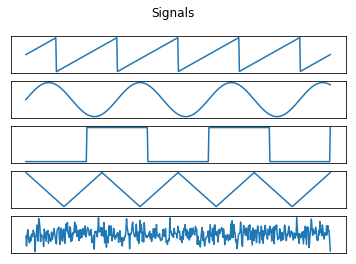

In [2]:
# Generate data
num_sources = 5
signal_length = 500
t = linspace(0, 1, signal_length)
S = np.c_[sawtooth(t), sine_wave(t, 0.3), square_wave(t, 0.4), triangle_wave(t, 0.25), np.random.randn(t.size)].T
plot_signals(S)

### 1.1 Make mixtures (5 points)
Write a function `make_mixtures(S, A)' that takes a matrix of source signals $\mathbf{S}$ and a mixing matrix $\mathbf{A}$, and generates mixed signals $\mathbf{X}$.

In [3]:
### 1.1 Make mixtures
def make_mixtures(S, A):
    # YOUR CODE HERE
    X = A @ S
    return X

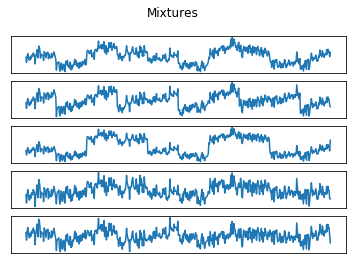

In [4]:
### Test your function
np.random.seed(42)
A = random_nonsingular_matrix(d=S.shape[0])
X = make_mixtures(S, A)
plot_signals(X, "Mixtures")

assert X.shape == (num_sources, signal_length), "The shape of your mixed signals is incorrect"


### 1.2 Histogram (5 points)
Write a function `plot_histograms(X)` that takes a data-matrix $\mathbf{X}$ and plots one histogram for each signal (row) in $\mathbf{X}$. You can use the `np.histogram()` (followed by `plot`) or `plt.hist()` function. 

Plot histograms of the sources and the measurements.

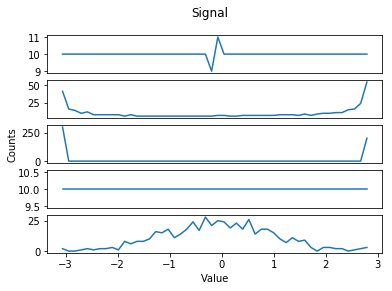

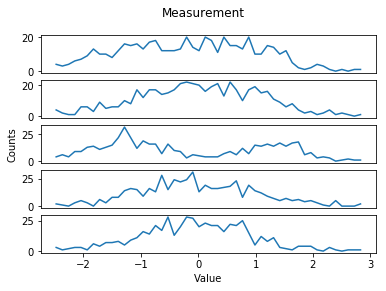

In [5]:
### 1.2 Histogram
# YOUR CODE HERE

def make_hist(data, title=""):
    for i, d in enumerate(data):
        ax = plt.subplot(data.shape[0], 1, i + 1)
        counts, edges = np.histogram(d, bins=50)
        values = [np.mean(edges[j:j+1]) for j in range(len(counts))]
        plt.plot(values, counts)
        if i == 2:
            plt.ylabel("Counts")
        if i+1 < data.shape[0]:
            ax.set_xticks([])
        else: 
            plt.xlabel("Value")
    plt.suptitle(title)
    plt.show()
    
make_hist(S, "Signal")
make_hist(X, "Measurement")

Which of these distributions (sources or measurements) tend to look more like Gaussians? Can you think of an explanation for this phenomenon? Why is this important for ICA?

YOUR ANSWER HERE

For the signals: the 5th signal looks more Gaussian than the others signals, because the 5th signal is actually Gaussian and the rest not. Also, it is required for ICA to work than no more than one signal is Gaussian.

For the measurements: now all the signals tend to look more like Gaussians. According to the central limit theorem (https://en.wikipedia.org/wiki/Independent_component_analysis#General_definition), the sum of independent random variables with finite variance will have a distribution that tends towards a Gaussian distribion,  and since our sources are independent, this is the case. This is important for ICA, as ICA can use this to maximize the non-gaussianity in order to reconstruct the signals.


### 1.3 Implicit priors (20 points)
As explained in MacKay's book, an activation function $\phi$ used in the ICA learning algorithm corresponds to a prior distribution over sources. Specifically, $\phi(a) = \frac{d}{da} \ln p(a)$. For each of the following activation functions, *derive* the source distribution they correspond to.
$$\phi_0(a) = -\tanh(a)$$
$$\phi_1(a) = -a + \tanh(a)$$
$$\phi_2(a) = -a^3$$
$$\phi_3(a) = -\frac{6a}{a^2 + 5}$$

Give your answer without the normalizing constant, so an answer of the form $p(a) \propto \verb+[answer]+$ is ok.

YOUR ANSWER HERE

With the help of https://www.wolframalpha.com:

\begin{align}
    p_0(a) &= \exp(\int-\tanh(a) \; da)= \exp(-\log(\cosh(a)) + const.) \propto \frac{1}{\cosh(a)}\\
    p_1(a) &= \exp(\int -a + tanh(a) \; da) = \exp(\log(\cosh(a)) - \frac{a^2}{2} + const.) \propto \cosh(a)\exp(-\frac{a^2}{2}) \\
    p_2(a) &= \exp(\int -a^3 \; da) = \exp(-\frac{a^4}{4} + const.) \propto \exp(- \frac{a^4}{4})\\
    p_3(a) &= \exp(\int - \frac{6a}{a^2 + 5} \; da) = \exp(-3 \log(a^2 + 5) + const.) \propto (a^2 + 5)^{-3}\\
\end{align}

In [6]:
def phi_0(a):
    return -np.tanh(a)

def p_0(a):
    # YOUR CODE HERE
    return 1/np.cosh(a)

In [7]:
def phi_1(a):
    return -a + np.tanh(a)

def p_1(a):
    # YOUR CODE HERE
    return np.cosh(a) * np.exp(-a*a / 2)

In [8]:
def phi_2(a):
    return -a**3

def p_2(a):
    # YOUR CODE HERE
    return np.exp(- a**4 / 4)

In [9]:
def phi_3(a):
    return -6*a / (a**2 + 5)

def p_3(a):
    # YOUR CODE HERE
    return 1 / (a*a + 5)**3

In [10]:
activation_functions = [phi_0, phi_1, phi_2, phi_3]
priors = [p_0, p_1, p_2, p_3]

a = np.linspace(-5, 5, 1000)
for prior in priors:
    assert prior(a).shape == (1000, ), "Wrong output shape"


Plot the activation functions and the corresponding prior distributions, from $a = -5$ to $5$ (hint: use the lists defined in the cell above). Compare the shape of the priors to the histogram you plotted in the last question.

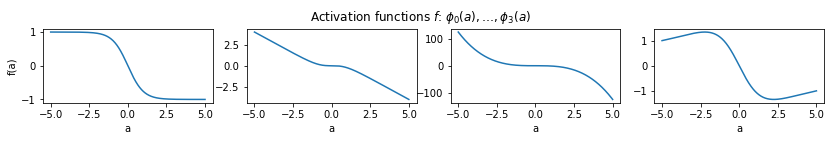

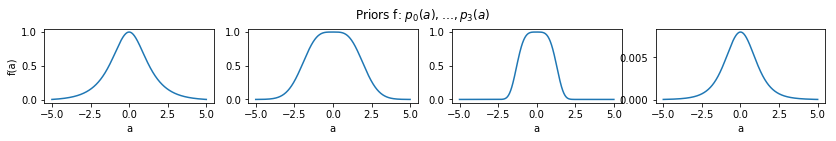

In [11]:
### 1.3 Implicit priors (continued)
a = np.linspace(-5, 5, 1000)

# YOUR CODE HERE
def make_func_plots(functions, title=""):
    figure(figsize=(14,3))
    for i, f in enumerate(functions):
        ax = plt.subplot(2, len(functions), i + 1)
        plt.plot(a, f(a))
        plt.xlabel("a")
        if i == 0:
            plt.ylabel("f(a)")
    
    plt.suptitle(title)
    plt.show()
    
make_func_plots(activation_functions, "Activation functions $f$: $\phi_0(a), \dots, \phi_3(a)$\n")
make_func_plots(priors, "Priors f: $p_0(a), \dots, p_3(a)$")

# the pointy ones (most left and most right) look more pointy than the histograms
# the middle two show a platau around the center, which is closer to the somewhat spread out histograms

### 1.4 Whitening (15 points)
Some ICA algorithms can only learn from whitened data. Write a method `whiten(X)` that takes a $M \times T$ data matrix $\mathbf{X}$ (where $M$ is the dimensionality and $T$ the number of examples) and returns a whitened matrix. If you forgot what whitening is or how to compute it, various good sources are available online, such as http://courses.media.mit.edu/2010fall/mas622j/whiten.pdf. Your function should also center the data before whitening.

In [12]:
### 1.4 Whitening
def whiten(X):
    # YOUR CODE HERE
    X = (X.T - np.mean(X,1)).T # center data
    sigma = np.cov(X) 
    phi, lamb, phiT = np.linalg.svd(sigma)
    
    return np.diag(lamb**(-0.5)) @ phiT @ X

In [13]:
### Test your function
Xw = whiten(X)
assert Xw.shape == (num_sources, signal_length), "The shape of your mixed signals is incorrect"


### 1.5 Interpret results of whitening (10 points)
Make 3 figures, one for the sources, one for measurements and one for the whitened measurements. In each figure, make $5 \times 5$ subplots with scatter plots for each pair of signals. Each axis represents a signal and each time-instance is plotted as a dot in this space. You can use the `plt.scatter()` function. Describe what you see.

Now compute and visualize the covariance matrix of the sources, the measurements and the whitened measurements. You can visualize each covariance matrix using this code:
```python
# Dummy covariance matrix C;
C = np.eye(5)  
ax = imshow(C, cmap='gray', interpolation='nearest')
```

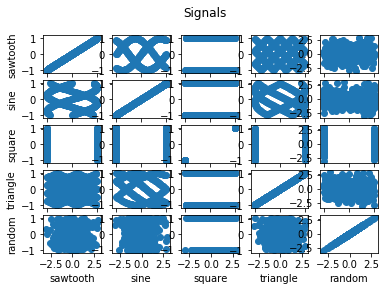

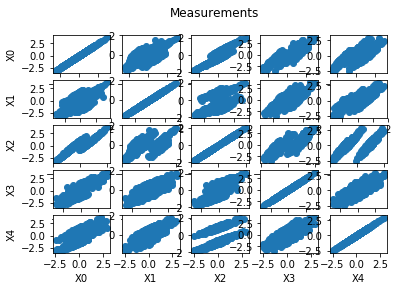

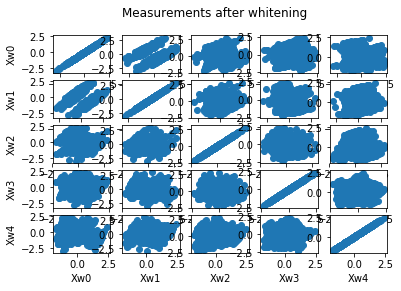

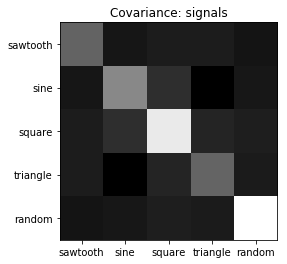

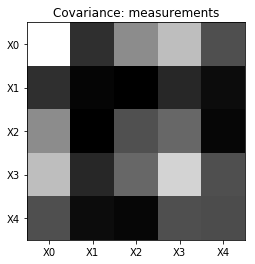

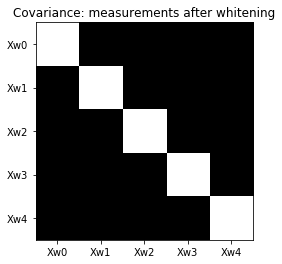

In [14]:
### 1.5 Interpret results of whitening

# YOUR CODE HERE

def make_scatter_figure(data, labels, title=""):
    for i, d1 in enumerate(data):
        for j, d2 in enumerate(data,1):
            ax = plt.subplot(data.shape[0], data.shape[0], i*data.shape[0] + j)
            plt.scatter(d1, d2)
            if j == 1:
                plt.ylabel(labels[i])
            if i+1 == len(data):
                plt.xlabel(labels[j-1])
    plt.suptitle(title)
    plt.show()
    
def show_covariance(data, ticks, title=""):
    ax = imshow(np.cov(data), cmap='gray', interpolation='nearest')
    plt.title(title)
    plt.xticks(range(len(data)), ticks)
    plt.yticks(range(len(data)), ticks)
    plt.show()
    
Slabels = ["sawtooth", "sine", "square", "triangle", "random"]
Xlabels = [f"X{i}" for i in range(len(X))]
Xwlabels = [f"Xw{i}" for i in range(len(Xw))]

make_scatter_figure(S, Slabels, "Signals")
make_scatter_figure(X, Xlabels, "Measurements")
make_scatter_figure(Xw, Xwlabels, "Measurements after whitening")

show_covariance(S, Slabels, "Covariance: signals")
show_covariance(X, Xlabels, "Covariance: measurements")
show_covariance(Xw, Xwlabels, "Covariance: measurements after whitening")

Are the signals independent after whitening?

YOUR ANSWER HERE

By looking at the structures in the second figure under "Measurements" we can see that the individual signals are dependent to some degree. This dependence reduces after whitening the data, since we can observe more circular structures in the third figure. However, we can still see that they are not perfectly circle-shaped (see for example the combination of Xw1 and Xw2) so we did not make the signals fully independent.

### 1.6 Covariance (5 points)
Explain what a covariant algorithm is. 

YOUR ANSWER HERE

A covariant algorithm is an algorithm that gives the same results independent of the units in which quantities are measured (MacKay). Whenever an equation is used, say A = B, then we want that [A] = [B], i.e. the units in which A is measured should equal the units in which B is measured.

### 1.7 Independent Component Analysis (25 points)
Implement the covariant ICA algorithm as described in MacKay. Write a function `ICA(X, activation_function, learning_rate)`, that returns the demixing matrix $\mathbf{W}$. The input `activation_function` should accept a function such as `lambda a: -tanh(a)`. Update the gradient in batch mode, averaging the gradients over the whole dataset for each update. Make it efficient, so use matrix operations instead of loops where possible (loops are slow in interpreted languages such as python and matlab, whereas matrix operations are internally computed using fast C code). Experiment with the learning rate and the initialization of $\mathbf{W}$. Your algorithm should be able to converge (i.e. `np.linalg.norm(grad) < 1e-5`) in within 10000 steps.

In [15]:
### 1.7 Independent Component Analysis
def ICA(X, activation_function, W=None, learning_rate=0.05, max_iter=30000, threshold=1e-5, print_info=False,
       print_convergence=True, print_label=""):
    # arg W is the initial mixing matrix
    
    # YOUR CODE HERE
    if W is None:
        W = np.random.normal(0, .1, (X.shape[0],X.shape[0]))
    
    for i in range(max_iter):
        A = W @ X
        Z = activation_function(A)
        X_ = W.T @ A
        
        dW = W + Z @ X_.T / X.shape[1]
        
        grad_norm = np.linalg.norm(dW)
        if isnan(grad_norm):
            if print_convergence:
                print(print_label+f"Grads too large after {i} iterations")
            break
        elif grad_norm < threshold:
            if print_convergence:
                print(print_label+f"Converged after {i} iterations")
            break
            
        W += learning_rate * dW
        
        if i % 200 == 0 and print_info:
            print(print_label+"[{:<6} grad_norm:  {:<0.1e}".format(str(i)+"]",grad_norm))
            
    if i+1 == max_iter and print_convergence:
        print(print_label+f"Reached maximum iteration of {max_iter}")
    return W

Ws = [None, np.random.rand(X.shape[0],X.shape[0])-.5, np.eye(X.shape[0])]
Wnames = ["Gaussian (mean=0, sigma=0.1)", "uniform (-0.5, 0.5)", "identity"]
lrs = [0.01,0.1,0.5]

for i, Winit in enumerate(Ws):
    print("W:", Wnames[i])
    for lr in lrs:
        print("  - lr =", lr)
        for j, phi in enumerate(activation_functions):
            _ = ICA(Xw, activation_function=phi, W=Winit, learning_rate=lr, print_label=f"      Xw - phi{j}: ")
        print()
        for j, phi in enumerate(activation_functions):
            _ = ICA(X, activation_function=phi, W=Winit, learning_rate=lr, print_label=f"      X - phi{j}: ")

# lr ~ 0.1 seems good - all converge
# choice of W initialization: not greatly convinced of one over the others

W: Gaussian (mean=0, sigma=0.1)
  - lr = 0.01
      Xw - phi0: Reached maximum iteration of 30000
      Xw - phi1: Converged after 14049 iterations
      Xw - phi2: Converged after 12187 iterations
      Xw - phi3: Converged after 24761 iterations

      X - phi0: Reached maximum iteration of 30000
      X - phi1: Converged after 15576 iterations
      X - phi2: Converged after 16122 iterations
      X - phi3: Reached maximum iteration of 30000
  - lr = 0.1
      Xw - phi0: Converged after 15036 iterations
      Xw - phi1: Converged after 1313 iterations
      Xw - phi2: Converged after 1538 iterations
      Xw - phi3: Converged after 4171 iterations

      X - phi0: Converged after 3596 iterations
      X - phi1: Converged after 1678 iterations
      X - phi2: Converged after 1308 iterations
      X - phi3: Converged after 3910 iterations
  - lr = 0.5
      Xw - phi0: Converged after 3087 iterations
      Xw - phi1: Converged after 473 iterations
      Xw - phi2: Reached maximum itera

/Users/Yke/Desktop/AI/Year2/RL/venv/miniconda3/envs/ml2labs/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


      Xw - phi0: Reached maximum iteration of 30000
      Xw - phi1: Converged after 15153 iterations
      Xw - phi2: Converged after 12476 iterations
      Xw - phi3: Reached maximum iteration of 30000

      X - phi0: Reached maximum iteration of 30000
      X - phi1: Converged after 13586 iterations
      X - phi2: Converged after 10986 iterations
      X - phi3: Reached maximum iteration of 30000
  - lr = 0.1
      Xw - phi0: Converged after 6705 iterations
      Xw - phi1: Converged after 1541 iterations
      Xw - phi2: Converged after 1332 iterations
      Xw - phi3: Converged after 5161 iterations

      X - phi0: Converged after 3274 iterations
      X - phi1: Converged after 1357 iterations
      X - phi2: Converged after 1180 iterations
      X - phi3: Converged after 3943 iterations
  - lr = 0.5
      Xw - phi0: Grads too large after 9 iterations
      Xw - phi1: Grads too large after 0 iterations
      Xw - phi2: Grads too large after 0 iterations
      Xw - phi3: Grads t

In [16]:
# We will test your function so make sure it runs with only X and phi as input, and returns only W
# Also it should converge for all activation functions

W_estimates = [ICA(Xw, activation_function=phi, learning_rate=1.0) for phi in activation_functions]
assert all([W_est.shape == (num_sources, num_sources) for W_est in W_estimates])


Reached maximum iteration of 30000
Reached maximum iteration of 30000
Grads too large after 30 iterations


/Users/Yke/Desktop/AI/Year2/RL/venv/miniconda3/envs/ml2labs/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  


Reached maximum iteration of 30000


### 1.8 Experiments  (5 points)
Run ICA on the provided signals using each activation function $\phi_0, \ldots, \phi_3$ (or reuse `W_estimates`). Use the found demixing matrix $\mathbf{W}$ to reconstruct the signals and plot the retreived signals for each choice of activation function.

W: Gaussian (mean=0, sigma=0.1)
    Xw - phi0: Converged after 15248 iterations
    Xw - phi1: Converged after 1230 iterations
    Xw - phi2: Converged after 1724 iterations
    Xw - phi3: Converged after 4341 iterations
W: uniform (-0.5, 0.5)
    Xw - phi0: Converged after 14910 iterations
    Xw - phi1: Converged after 1541 iterations
    Xw - phi2: Converged after 1332 iterations
    Xw - phi3: Converged after 5161 iterations
W: identity
    Xw - phi0: Converged after 14939 iterations
    Xw - phi1: Converged after 1541 iterations
    Xw - phi2: Converged after 1332 iterations
    Xw - phi3: Converged after 5161 iterations


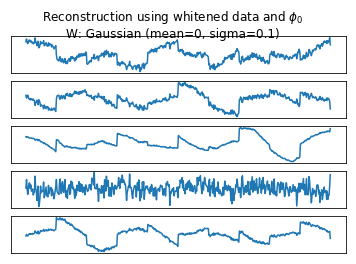

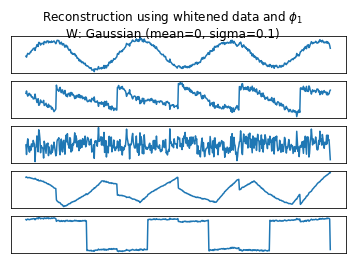

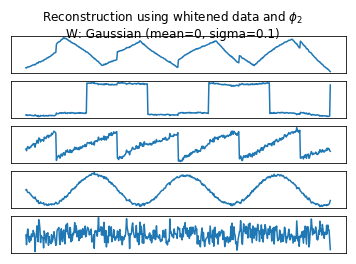

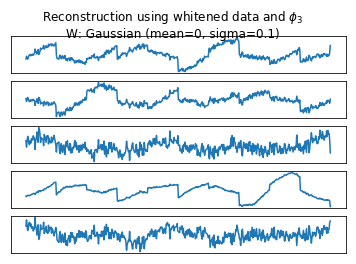

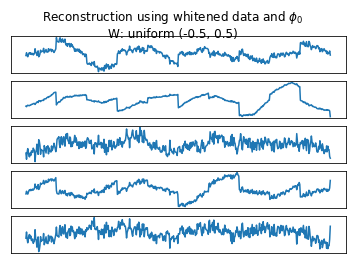

...

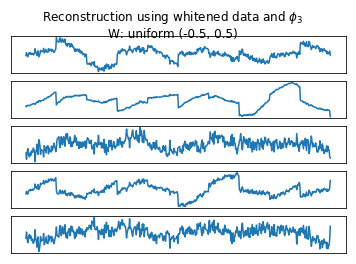

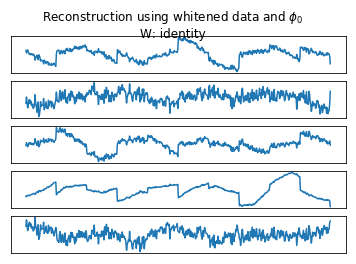

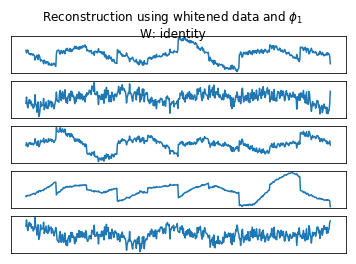

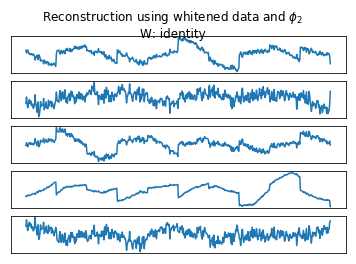

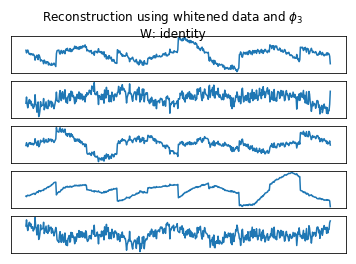

In [17]:
# 1.8 Experiments

# YOUR CODE HERE
# using guassian ititialization of W, as it gives reasonable results
Ws = [None, np.random.rand(X.shape[0],X.shape[0])-.5, np.eye(X.shape[0])]
for i, Winit in enumerate(Ws):
    
    print("W:", Wnames[i])
    W_estimates = [ICA(Xw, activation_function=phi, W=Winit, learning_rate=0.1, print_label=f"    Xw - phi{j}: ") for j,phi in enumerate(activation_functions)]
    S_reconstr = [W @ Xw for W in W_estimates]

    for j, S_ in enumerate(S_reconstr):
        plot_signals(S_, f"Reconstruction using whitened data and $\phi_{j}$\nW: {Wnames[i]}")

# Gaussian wins! (better reconstructions) and also phi1 and phi2

# use for later:
W_estimates = [ICA(Xw, activation_function=phi, learning_rate=0.1, print_convergence=False) for phi in activation_functions]
S_reconstr = [W @ Xw for W in W_estimates]

Does it make a difference (in terms of speed of convergence) if you whiten your data before running ICA?
    

YOUR ANSWER HERE

In terms of number of iterations, ICA with non-whitened data more often converges faster than with whitened data. But not in every case.


### 1.9 Audio demixing (10 points)
The 'cocktail party effect' refers to the ability humans have to attend to one speaker in a noisy room. We will now use ICA to solve a similar but somewhat idealized version of this problem. The code below loads 5 sound files and plots them.

Use a random non-singular mixing matrix to mix the 5 sound files. You can listen to the results in your browser using `play_signals`, or save them to disk if this does not work for you. Plot histograms of the mixed audio and use your ICA implementation to de-mix these and reproduce the original source signals. As in the previous exercise, try each of the activation functions.

Keep in mind that this problem is easier than the real cocktail party problem, because in real life there are often more sources than measurements (we have only two ears!), and the number of sources is unknown and variable. Also, mixing is not instantaneous in real life, because the sound from one source arrives at each ear at a different point in time. If you have time left, you can think of ways to deal with these issues.

In [18]:
import scipy.io.wavfile
from IPython.display import Audio, display, Markdown

# Save mixtures to disk, so you can listen to them in your audio player
def save_wav(data, out_file, rate):
    scaled = np.int16(data / np.max(np.abs(data)) * 32767)
    scipy.io.wavfile.write(out_file, rate, scaled)

# Or play them in your browser
def play_signals(S, sample_rate, title="Signals"):
    display(Markdown(title))
    for signal in S:
        display(Audio(signal, rate=sample_rate))

Signals

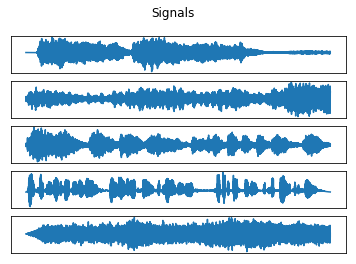

In [19]:
# Load audio sources
source_files = ['beet.wav', 'beet9.wav', 'beet92.wav', 'mike.wav', 'street.wav']
wav_data = []
sample_rate = None
for f in source_files:
    sr, data = scipy.io.wavfile.read(f, mmap=False)
    if sample_rate is None:
        sample_rate = sr
    else:
        assert(sample_rate == sr)
    wav_data.append(data[:190000])  # cut off the last part so that all signals have same length

# Create source and measurement data
S_audio = np.c_[wav_data]
plot_signals(S_audio)
play_signals(S_audio, sample_rate)

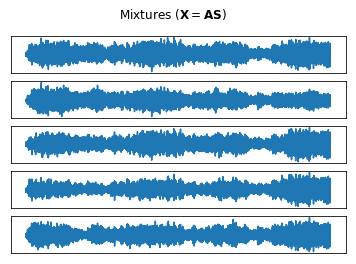

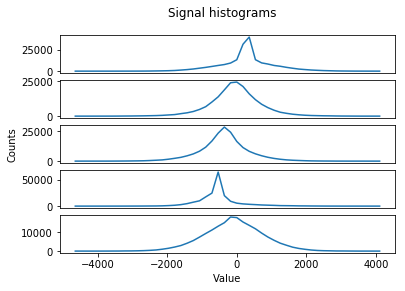

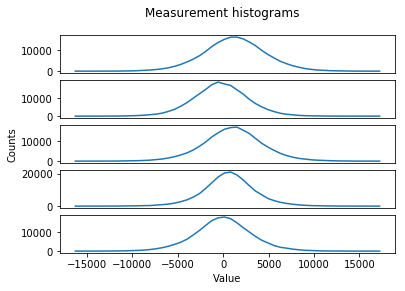

Xw_audio - phi0, lr=0.5: Converged after 161 iterations
Xw_audio - phi1, lr=0.5: Converged after 1456 iterations
Xw_audio - phi2, lr=0.2: Converged after 970 iterations
Xw_audio - phi3, lr=0.1: Converged after 741 iterations


Reconstructed audio; $\phi_0$

Reconstructed audio; $\phi_1$

Reconstructed audio; $\phi_2$

Reconstructed audio; $\phi_3$

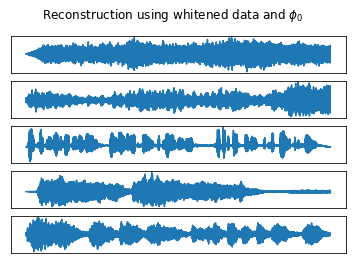

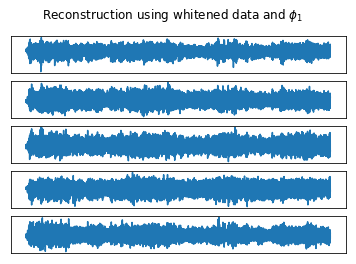

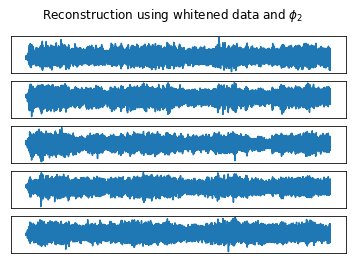

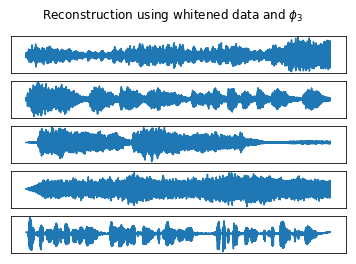

In [20]:
### 1.9 Audio demixing

# YOUR CODE HERE

A_audio = random_nonsingular_matrix(d=S.shape[0])
X_audio = make_mixtures(S_audio, A_audio)
plot_signals(X_audio, "Mixtures ($\mathbf{X} = \mathbf{A S}$)")
plt.show()

#================================================

make_hist(S_audio, "Signal histograms")
make_hist(X_audio, "Measurement histograms")

#================================================

Xw_audio = whiten(X_audio)

# #================================================

lrs = [0.5,0.5,0.2,0.1]
phi_lr = zip(activation_functions, lrs)
W_estimates_audio = [ICA(Xw_audio, activation_function=phi, learning_rate=lr, print_label=f"Xw_audio - phi{i}, lr={lr}: ") for i,(phi,lr) in enumerate(phi_lr)]
S_audio_reconstr = [W_audio @ Xw_audio for W_audio in W_estimates_audio]

for i, S_audio_ in enumerate(S_audio_reconstr):
    plot_signals(S_audio_, f"Reconstruction using whitened data and $\phi_{i}$")
    play_signals(S_audio_, sample_rate, f"Reconstructed audio; $\phi_{i}$")

### Report your results. Using which activation functions ICA recovers the sources?

YOUR ANSWER HERE

Activation funcions $\phi_0$ and $\phi_3$ were able to recover the sources properly. Using $\phi_1$ and $\phi_2$ results in the audio's being still mixed after convergence.

### 1.10 Excess Kurtosis (15 points)
The (excess) kurtosis is a measure of 'peakedness' of a distribution. It is defined as
$$
\verb+Kurt+[X] = \frac{\mu_4}{\sigma^4} - 3 = \frac{\operatorname{E}[(X-{\mu})^4]}{(\operatorname{E}[(X-{\mu})^2])^2} - 3
$$
Here, $\mu_4$ is known as the fourth moment about the mean, and $\sigma$ is the standard deviation.
The '-3' term is introduced so that a Gaussian random variable has 0 excess kurtosis.
We will now try to understand the performance of the various activation functions by considering the kurtosis of the corresponding priors, and comparing those to the empirical kurtosis of our data.

#### 1.10.1 (10 points)
First, compute analytically the kurtosis of the four priors that you derived from the activation functions before. You may find it helpful to use an online service such as [Wolfram Alpha](https://www.wolframalpha.com/) or [Integral Calculator](https://www.integral-calculator.com/) to (help you) evaluate the required integrals. Give your answer as both an exact expression as well as a numerical approximation (for example $\frac{\pi}{2} \approx 1.571$).

YOUR ANSWER HERE

It can be seen from the figures in section 1.3 that each prior is centered around 0. Calculating the mean of each prior $p_i$ as $\mu_i = \int_{-\infty}^{\infty} a \cdot p_i(a) \; da$ also shows that each $\mu_i = 0$. In our case the kurtosis therefore simplifies to:
$$
\verb+Kurt+[X] = \frac{\operatorname{E}[X^4]}{(\operatorname{E}[X^2])^2} - 3
$$

In the following we introduce constant $C$ for each prior to make the prior integrate to one. Wolfram Alpha was used to calculate integrals.

$p_0$:
\begin{align}
C &= \int_{-\infty}^{\infty} \frac{1}{\cosh(a)} \; da = \pi\\
\operatorname{E}[X^4] &= \frac{1}{C} \int_{-\infty}^{\infty} \frac{a^4}{\cosh(a)} \; da 
= \frac{1}{C}\frac{5\pi^5}{16} \\
(\operatorname{E}[X^2])^2 &= \big(\frac{1}{C} \int_{-\infty}^{\infty} \frac{a^2}{\cosh(a)} \; da \big)^2 
= \frac{1}{C^2}\frac{\pi^6}{16} \\
\verb+Kurt+[X] &= \frac{1}{C}\frac{5\pi^5}{16} \cdot C^2\frac{16}{\pi^6} -3 = \frac{5C}{\pi} - 3 = 2
\end{align}

$p_1$:
\begin{align}
C &= \int_{-\infty}^{\infty} \cosh(a)\exp(-\frac{a^2}{2}) \; da = \sqrt{2e \pi}\\
\operatorname{E}[X^4] &= \frac{1}{C} \int_{-\infty}^{\infty} a^4\cosh(a)\exp(-\frac{a^2}{2}) \; da
= \frac{1}{C}10\sqrt{2e \pi} \\
(\operatorname{E}[X^2])^2 &= \big(\frac{1}{C} \int_{-\infty}^{\infty} a^2\cosh(a)\exp(-\frac{a^2}{2}) \; da\big)^2
= \frac{1}{C^2}4 (\sqrt{2e \pi})^2\\
\verb+Kurt+[X] &= \frac{1}{C}10\sqrt{2e \pi} \cdot C^2 \frac{1}{4 (\sqrt{2e \pi})^2} -3 = \frac{2.5\cdot C}{\sqrt{2e\pi}} -3  = -0.5
\end{align}

$p_2$:
\begin{align}
C &= \int_{-\infty}^{\infty} \exp(- \frac{a^4}{4}) \; da = \frac{\Gamma(\frac{1}{4})}{\sqrt{2}}\\
\operatorname{E}[X^4] &= \frac{1}{C} \int_{-\infty}^{\infty} a^4 \exp(- \frac{a^4}{4}) \; da
= \frac{1}{C} \frac{\Gamma(\frac{1}{4})}{\sqrt{2}}\\
(\operatorname{E}[X^2])^2 &= \big(\frac{1}{C} \int_{-\infty}^{\infty} a^2 \exp(- \frac{a^4}{4}) \; da \big)^2
= \frac{1}{C^2}2 \Gamma(\frac{3}{4})^2\\
\verb+Kurt+[X] &= \frac{1}{C} \frac{\Gamma(\frac{1}{4})}{\sqrt{2}} \cdot C^2 \frac{1}{2 \Gamma(\frac{3}{4})^2} - 3
= C \cdot \frac{\Gamma(\frac{1}{4})^3}{4 \sqrt{2} \pi^2} - 3 = \frac{\Gamma(\frac{1}{4})^4}{8\pi^2} - 3 \approx -0.812
\end{align}

$p_3$:
\begin{align}
C &= \int_{-\infty}^{\infty} \frac{1}{(a^2 + 5)^3} \; da = \frac{3\pi}{200 \sqrt{5}} \\
\operatorname{E}[X^4] &= \frac{1}{C} \int_{-\infty}^{\infty} a^4 \frac{1}{(a^2 + 5)^3} \; da
= \frac{1}{C} \frac{3\pi}{8\sqrt{5}}\\
(\operatorname{E}[X^2])^2 &= \big(\frac{1}{C} \int_{-\infty}^{\infty} a^2 \frac{1}{(a^2 + 5)^3} \; da \big)^2
= \frac{1}{C^2} \frac{\pi^2}{8000}\\
\verb+Kurt+[X] &= \frac{1}{C} \frac{3\pi}{8\sqrt{5}} \cdot C^2 \frac{8000}{\pi^2} - 3 = \frac{3000 C}{\pi\sqrt{5}} - 3 
= \frac{9000}{200\cdot{5}} - 3 = 6
\end{align}

In [21]:
### Include your answer here (you can use math.gamma if needed)
def get_kurtosis():
    # Return a list with 4 numbers / expressions
    # return [0, 0, 0, 0]
    
    # YOUR CODE HERE
    return [2., -.5, math.gamma(0.25)**4 / (8*math.pi**2) - 3, 6.]

In [22]:
# Let's check
kurtosis = get_kurtosis()
print (kurtosis)
assert len(kurtosis) == 4


[2.0, -0.5, -0.8115603847735224, 6.0]


#### 1.10.2 (5 points)
Now use the `scipy.stats.kurtosis` function, with the `fisher` option set to `True`, to compute the empirical kurtosis of the dummy signals and the real audio signals.

Can you use this data to explain the performance of the various activation functions on the synthetic and real data?

In [23]:
### 1.10.2 Excess Kurtosis
# YOUR CODE HERE
import scipy.stats

def align_measurements(K1, K2):
    # alignment not always accurate
    N = len(K1)
    K_smallest_diff = 1e3
    for i1 in range(N):
        for i2 in range(N):
            if i2 != i1:
                for i3 in range(N):
                    if i3 != i2 and i3 != i1:
                        for i4 in range(N):
                            if i4 != i3 and i4 != i2 and i4 != i1:
                                for i5 in range(N):
                                    if i5 != i4 and i5 != i3 and i4 != i2 and i4 != i1:
                                        K2_cand = [K2[i] for i in [i1,i2,i3,i4,i5]]
                                        K_diff = sum([abs(K1[i]-K2_cand[i]) for i in range(N)])
                                        if K_diff < K_smallest_diff:
                                            K_smallest_diff = K_diff
                                            K2_aligned = list(K2_cand)
    return K2_aligned


def print_kurtosis_vals(signl, signl_reconstr, title="") :
    signl_kurt = scipy.stats.kurtosis(signl, axis=1, fisher=True)
    signl_reconstr_kurt = [scipy.stats.kurtosis(signl_, axis=1, fisher=True) for signl_ in signl_reconstr]
    print(title)
    print("  Source  :      ", signl_kurt)
    print("  Reconstr:")
    lsts_aligned = []
    for i, lst in enumerate(signl_reconstr_kurt):
        lst_aligned = align_measurements(signl_kurt, lst)
        lsts_aligned.append(lst_aligned)
        print(f"           phi{i}:  ", [round(e,8) for e in lst_aligned])
    print("  Minimal abs difference between source and reconstructed signal (aligned with source):")
    for i, lst_aligned in enumerate(lsts_aligned):
        kurt_difference = [round(abs(signl_kurt[j]-lst_aligned[j]),8) for j in range(len(signl_kurt))]
        print(f"           phi{i}:  ", kurt_difference)
    print()

S_audio_kurt = scipy.stats.kurtosis(S_audio, axis=1, fisher=True)
S_audio_reconstr_kurt = [scipy.stats.kurtosis(S_audio_, axis=1, fisher=True) for S_audio_ in S_audio_reconstr]

print_kurtosis_vals(S, S_reconstr, "Dummy signal empirical kurtosis:")
print_kurtosis_vals(S_audio, S_audio_reconstr, "Audio signal empirical kurtosis:")

# note: alignment between signal and reconstruction is not gauranteed accurate

Dummy signal empirical kurtosis:
  Source  :       [-1.19640244 -1.48287113 -1.84019701 -1.2000384  -0.00282748]
  Reconstr:
           phi0:   [-0.60479969, 0.02902452, 0.21139202, -0.03783502, 0.02902452]
           phi1:   [-1.17342277, -1.45750429, -1.82486843, -0.98875729, -0.29794237]
           phi2:   [-1.1095415, -1.48713954, -1.82567874, -1.15535577, -0.27153841]
           phi3:   [0.01459487, -0.02360333, -0.06108636, 0.10941441, 0.01459487]
  Minimal abs difference between source and reconstructed signal (aligned with source):
           phi0:   [0.59160275, 1.51189565, 2.05158903, 1.16220338, 0.031852]
           phi1:   [0.02297968, 0.02536685, 0.01532858, 0.21128111, 0.29511489]
           phi2:   [0.08686094, 0.00426841, 0.01451827, 0.04468263, 0.26871093]
           phi3:   [1.21099731, 1.4592678, 1.77911065, 1.30945281, 0.01742235]

Audio signal empirical kurtosis:
  Source  :       [1.79431517 2.06885064 1.93609295 5.05191721 0.53887581]
  Reconstr:
           phi0:

YOUR ANSWER HERE

We have seen that priors $\phi_1$ and $\phi_2$ work well for the dummy signal and  $\phi_0$ and $\phi_3$ for the audio signal. If we look at the corresponding empirical kurtosis (in particular, the difference between the aligned signals) we see that exactly for those cases the differences between empirical kurtosis for source and reconstruction are low. We can therefore distinguish good reconstructions by their lower empirical kurtosis difference with the source signal, and worse reconstruction by their higher empirical kurtosis difference with the source signal.